This is another crosslinking approach termed 'instant crosslinking,' a main property of which was the absence of an artificial cap on how many crosslinks per step could be made.

In this script we analyze the approach.

Specifically, we analyze structural properties of equilibrated gel simulations across varied force fields (FF), volume fraction (VF), and crosslink percentage. Our goal is to quantify network structure (pores) and spatial distributions (beads, crosslinks). Analysis reveals strong dependencies of pore size/count on VF and crosslink amount, confirming minimal structural differences due to the tested FF variations.

In [1]:
import sys
import importlib

sys.path.append("../")

In [ ]:
import json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import common
import analysis
import analysis.network

importlib.reload(common)
importlib.reload(analysis)
importlib.reload(analysis.network)
print()

<module 'analysis.network' from '/Users/r/Documents/work/icp/microgel/code/src/notebooks/../analysis/network.py'>

In [3]:
def find_and_check_pairs(arr, p):
    """
    Prints pairs with repeated elements and checks for multiples of p.

    Args:
        arr: A NumPy array of shape (N, 2) containing integer pairs.
        p: An integer to check for multiplicity.
    """
    N = arr.shape[0]
    if N == 0:  # Handle empty array
        return

    # Efficiently find repeated elements using sets and dictionaries
    all_elements = arr.flatten()
    counts = {}
    repeated_elements = set()

    for element in all_elements:
        if element in counts:
            counts[element] += 1
            repeated_elements.add(element)
        else:
            counts[element] = 1

    # Iterate through the pairs and check for repeated elements and multiples of p
    total = 0
    for pair in arr:
        for element in pair:
            if counts[element] < 2:
                continue
            mask = (arr[:, 0] == pair[0]) | (arr[:, 1] == pair[0]) | (arr[:, 0] == pair[1]) | (arr[:, 1] == pair[1])
            print(
                f"[{counts[pair[0]]}x |{pair[0]:>5}| ({str((pair[0] % p == 0) or ((pair[0]+1) % p == 0)):5}, {p}),"
                f" {counts[pair[1]]}x |{pair[1]:>5}| ({str((pair[1] % p == 0) or ((pair[1]+1) % p == 0)):5}, {p})]"
                f" {arr[mask].tolist()}"
            )
            total += 1
            break
    if total > 0:
        print(f"Total: {total}")
        print(arr.T)
        print("-" * 100)
        print()


# # Example usage:
# arr = np.array([[1, 2], [3, 4], [1, 5], [6, 2], [7, 8], [3, 9]])
# p = 3

# find_and_check_pairs(arr, p)


# arr2 = np.array(
#     [[1, 2], [3, 2], [5, 6]]
# )  # Example with all pairs having a repeated element.
# p2 = 2
# find_and_check_pairs(arr2, p2)


# arr3 = np.array([])  # Example with empty array
# p3 = 3

# find_and_check_pairs(arr3, p3)  # Should not print anything

In [ ]:
root_dir = Path("../../data/raw/30112024_forcefield_eq_time_fixed")
root_dir.resolve(), root_dir.exists()
if not root_dir.exists():
    raise

(PosixPath('/Users/r/Documents/work/icp/microgel/code/data/raw/30112024_forcefield_eq_time_fixed'),
 True)

In [5]:
import tqdm

gel_dirs = list(map(common.GelDir.from_inner, root_dir.rglob("current_checkpoint.txt")))
print(gel_dirs[:3])
print(len(gel_dirs))

records = []
for i, gel_dir in enumerate(tqdm.tqdm(gel_dirs.copy())):
    config = json.loads(gel_dir.config_path.read_text())

    try:
        [p.name for p in gel_dir.checkpoints_dir.iterdir()]
    except FileNotFoundError:
        continue

    if "GelCrosslinkedDone" not in [p.name for p in gel_dir.checkpoints_dir.iterdir()]:
        # print(f"{gel_dir.path.relative_to(root_dir)} didn't finish ({config})")
        gel_dirs.remove(gel_dir)
        continue

    if gel_dir.n_crosslinks < 1:
        # print(f"{gel_dir.path.relative_to(root_dir)} failed ({config})")
        gel_dirs.remove(gel_dir)
        continue

    config2 = {
        "run": int(gel_dir.path.name.split("_")[0].split("=")[1]),
        "seed": config["seed"],
        "charge": config["charge_per_bead"],
        "vf": config["volume_fraction"],
        "crosslink": config["crosslink_percentage"],
        "ff": config["agent_force_field"],
    }

    bead_points = common.CheckpointDir(gel_dir.current_checkpoint_dir).get_bead_points()
    pore_analyzer = analysis.network.PoreAnalyzer.from_gel_dir(gel_dir.path)
    records.append(dict())
    records[-1].update(config2)
    records[-1].update(
        dict(
            n_actual_crosslinks=gel_dir.n_crosslinks,
            pores=pore_analyzer.pores,
            beads_per_pore=pore_analyzer.beads_per_pore,
            n_pores=len(pore_analyzer.pores),
            pore_size_mean=np.mean(pore_analyzer.beads_per_pore),
            pore_size_median=np.median(pore_analyzer.beads_per_pore),
            gel_dir=gel_dir,
        )
    )
    find_and_check_pairs(gel_dir.crosslinks_numpy, config["chain_length"])

[GelDir(path=PosixPath('../../data/raw/30112024_forcefield_eq_time_fixed/run=3_ff=none_charge=0.15_vf=0.45_crosslink=0.7')), GelDir(path=PosixPath('../../data/raw/30112024_forcefield_eq_time_fixed/run=3_ff=exp_charge=0.15_vf=0.6_crosslink=0.7')), GelDir(path=PosixPath('../../data/raw/30112024_forcefield_eq_time_fixed/run=3_ff=harmonic_charge=0.25_vf=0.6_crosslink=0.2'))]
270


100%|██████████| 270/270 [00:21<00:00, 12.42it/s]


In [6]:
CHAIN_LENGTH = gel_dirs[0].config.chain_length
CHAIN_LENGTH

60

In [7]:
len(gel_dirs), len(list(root_dir.iterdir()))

(121, 270)

In [8]:
df = pd.DataFrame.from_records(records)
df[["run", "seed"]] = df[["run", "seed"]].astype(int)
df[["charge", "vf", "crosslink"]] = df[["charge", "vf", "crosslink"]].astype(float)
df[["ff"]] = df[["ff"]].astype("category")
display(df.dtypes)
display(len(df))
display(df)

run                       int64
seed                      int64
charge                  float64
vf                      float64
crosslink               float64
ff                     category
n_actual_crosslinks       int64
pores                    object
beads_per_pore           object
n_pores                   int64
pore_size_mean          float64
pore_size_median        float64
gel_dir                  object
dtype: object

116

,run,seed,charge,vf,crosslink,ff,n_actual_crosslinks,pores,beads_per_pore,n_pores,pore_size_mean,pore_size_median,gel_dir
0,3,95399302,0.05,0.45,0.7,exp,1470,"[[1912, 1914, 1913], [988, 987, 986, 2793, 279...","[3, 21, 30, 3, 4, 3, 5, 4, 3, 7, 7, 4, 5, 12, ...",1401,292.426124,59.0,GelDir(path=PosixPath('../../data/raw/30112024...
1,0,72770814,0.15,0.45,0.7,harmonic,1470,"[[4174, 4176, 4175], [2154, 2155, 2153], [1327...","[3, 3, 3, 3, 3, 6, 6, 14, 5, 6, 45, 3, 3, 3, 1...",1401,340.332620,27.0,GelDir(path=PosixPath('../../data/raw/30112024...
2,3,52944017,0.05,0.60,0.2,exp,420,"[[2534, 2535, 2533], [3499, 3500, 2697, 2696, ...","[3, 5, 3, 3, 3, 8, 3, 3, 3, 206, 9, 4, 79, 3, ...",351,276.290598,79.0,GelDir(path=PosixPath('../../data/raw/30112024...
3,3,47070477,0.05,0.30,0.2,none,420,"[[956, 955, 954, 957], [2570, 2573, 2572, 2571...","[4, 4, 4, 24, 3, 16, 15, 6, 3, 23, 11, 236, 4,...",351,233.660969,19.0,GelDir(path=PosixPath('../../data/raw/30112024...
4,4,80841094,0.05,0.60,0.7,none,1470,"[[4168, 4167, 4170, 4169], [3145, 3146, 3649, ...","[4, 9, 8, 3, 9, 5, 4, 6, 7, 3, 14, 7, 5, 10, 5...",1401,381.990007,106.0,GelDir(path=PosixPath('../../data/raw/30112024...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
111,0,77177503,0.05,0.30,0.7,none,1470,"[[1120, 1121, 1119], [1116, 1115, 1122, 1121, ...","[3, 7, 3, 4, 3, 3, 3, 3, 18, 36, 20, 28, 3, 28...",1401,280.637402,23.0,GelDir(path=PosixPath('../../data/raw/30112024...
112,4,56485824,0.05,0.60,0.7,harmonic,1470,"[[1759, 2727, 2726, 1758], [1774, 1773, 1776, ...","[4, 4, 6, 11, 27, 13, 9, 3, 4, 3, 14, 5, 4, 6,...",1401,312.870807,63.0,GelDir(path=PosixPath('../../data/raw/30112024...
113,2,61075297,0.05,0.45,0.2,none,420,"[[3017, 3019, 3018], [297, 298, 296], [3415, 3...","[3, 3, 5, 18, 3, 7, 8, 33, 39, 19, 3, 68, 68, ...",351,227.903134,44.0,GelDir(path=PosixPath('../../data/raw/30112024...
114,1,70862919,0.05,0.45,0.7,none,1470,"[[913, 3684, 3683, 3679, 3678, 912], [913, 914...","[6, 4, 6, 5, 3, 22, 6, 3, 3, 5, 7, 6, 8, 8, 15...",1401,363.122769,98.0,GelDir(path=PosixPath('../../data/raw/30112024...


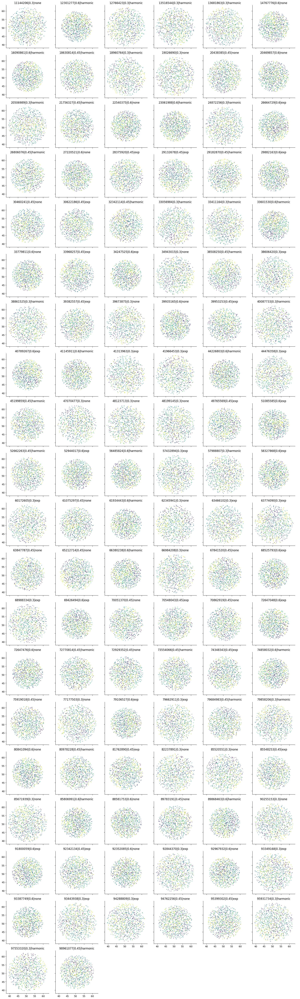

In [9]:
import seaborn as sns

import analysis.distribution

bead_df = pd.DataFrame.from_records(
    [
        dict(
            seed=row["seed"],
            gel_dir=row["gel_dir"],
            ckpt_dir=common.CheckpointDir(row["gel_dir"].checkpoints_dir / "GelCrosslinkedDone"),
        )
        for i, row in df.iterrows()
    ]
)


def plot_gels(df, step=1, with_box=False):
    g = sns.FacetGrid(
        df,
        col="seed",
        col_wrap=6,
    )

    def plot_points(data, color, **kwargs):
        # bead_pos = np.load(data["paths"].iloc[0])[::step]
        ckpt_dir = data["ckpt_dir"].iloc[0]
        bead_pos = ckpt_dir.get_bead_points()
        gel_dir = data["gel_dir"].iloc[0]
        vf = gel_dir.config.volume_fraction

        ax = plt.gca()
        ff = gel_dir.config.agent_force_field
        color = np.arange(len(bead_pos[::5])) % CHAIN_LENGTH
        # color=dict(none="C0", harmonic="C1", exp="C2")[ff]
        # rnd_result = analysis.distribution.compute_radial_number_density(bead_pos, use_multi_bin_smooth=True)
        # ax.plot(rnd_result.r, rnd_result.number_density, color=color)
        ax.scatter(*bead_pos[::5, :2].T, s=1.0, alpha=1.0, c=color)
        seed = data["seed"].iloc[0]
        ax.set_title(f"{seed}|{vf}|{ff}")
        if with_box:
            box_l = data["box_l"].iloc[0]
            ax.hlines([0, box_l], 0, box_l, color="k")
            ax.vlines([0, box_l], 0, box_l, color="k")
        ax.set_aspect("equal")

    g.map_dataframe(plot_points)
    g.add_legend()
    plt.tight_layout()
    plt.show()


plot_gels(bead_df)

In [10]:
from pprint import pprint


def unique_per_column(df):
    unique_values = {}
    for col in df.columns:
        try:
            unique_values[col] = len(df[col].unique().tolist())
        except TypeError:
            pass
    return unique_values


important_cols = ["charge", "crosslink", "ff", "vf"]
pprint(unique_per_column(df))
print(important_cols)

{'charge': 2,
 'crosslink': 2,
 'ff': 3,
 'gel_dir': 116,
 'n_actual_crosslinks': 12,
 'n_pores': 12,
 'pore_size_mean': 116,
 'pore_size_median': 61,
 'run': 5,
 'seed': 116,
 'vf': 3}
['charge', 'crosslink', 'ff', 'vf']


## Mittlere Länge der kürzesten Schlaufe

In [11]:
df["smallest_pore_size"] = [min(x) for x in df["beads_per_pore"]]
print(df["smallest_pore_size"].unique())

[3]


## Mittlere Anzahl der Kettenglieder zwischen zwei Cross-Links (aka. beads per pore)
Ist aber ziemlich nichtssagend, daher besser Median

Idealerweise sollte es mit steigender meshw auch ansteigen.

In [12]:
df[important_cols + ["pore_size_median", "pore_size_mean"]].sort_values(by=["vf", "crosslink", "ff"], ignore_index=True)

,charge,crosslink,ff,vf,pore_size_median,pore_size_mean
0,0.15,0.2,exp,0.3,21.0,238.401869
1,0.15,0.2,exp,0.3,14.0,151.116809
2,0.05,0.2,exp,0.3,19.0,265.000000
3,0.05,0.2,exp,0.3,14.0,190.199430
4,0.05,0.2,exp,0.3,24.5,224.534024
...,...,...,...,...,...,...
111,0.05,0.7,none,0.6,69.0,336.947894
112,0.05,0.7,none,0.6,56.0,330.329051
113,0.15,0.7,none,0.6,74.0,315.149179
114,0.05,0.7,none,0.6,113.0,352.836545


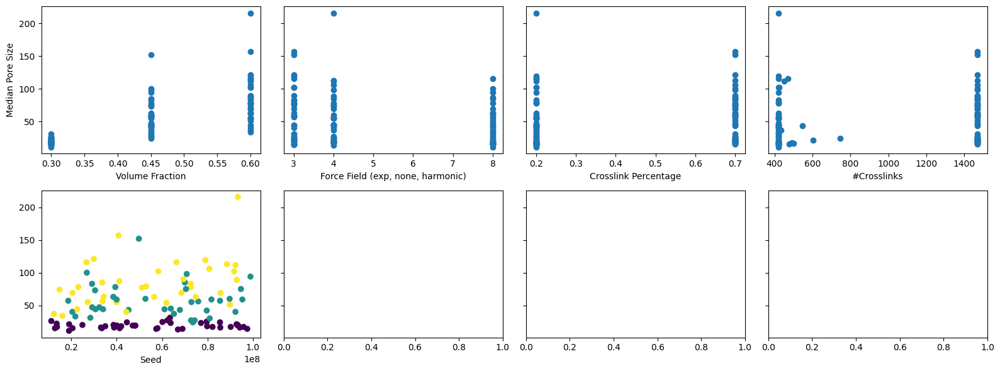

In [13]:
fig, axs = plt.subplots(2, 4, figsize=(16, 6), sharey=True)
axs = axs.flat

markers = np.array(
    [
        ".",
        ",",
        "o",
        "v",
        "^",
        "<",
        ">",
        "1",
        "2",
        "3",
        "4",
        "s",
        "p",
        "*",
        "h",
        "H",
        "D",
        "d",
        "P",
        "x",
        "+",
        "X",
    ]
)

y = df["pore_size_median"]

ax = next(axs)
ax.set_ylabel("Median Pore Size")
ax.set_xlabel("Volume Fraction")
ax.scatter(df["vf"], y)

ax = next(axs)
ax.set_xlabel("Force Field (exp, none, harmonic)")
ax.scatter(list(map(len, df["ff"])), y)

ax = next(axs)
ax.set_xlabel("Crosslink Percentage")
ax.scatter(df["crosslink"], y)

ax = next(axs)
ax.set_xlabel("#Crosslinks")
ax.scatter(df["n_actual_crosslinks"], y)

ax = next(axs)
ax.set_xlabel("Seed")
ax.scatter(df["seed"], y, c=df["vf"])

# for (clp, vf), sub_df in df.groupby(["crosslink", "vf"]):
#     color = dict(zip(df["vf"].unique(), ["C0", "C1", "C2"]))[vf]
#     marker = dict(zip(df["crosslink"].unique(), ["o", "x", "s"]))[clp]
#     # print(color, marker)
#     ax.scatter(sub_df["seed"], y[sub_df.index], color=color, marker=marker, label=f"{clp=}|{vf=}")
# ax.legend()

plt.tight_layout()
plt.show()

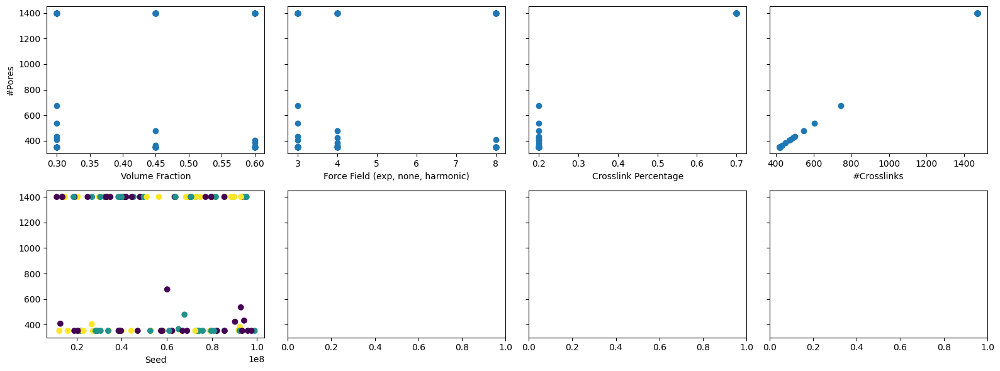

In [14]:
fig, axs = plt.subplots(2, 4, figsize=(16, 6), sharey=True)
axs = axs.flat

markers = np.array([".", ",", "o", "v"])

y = df["n_pores"]

ax = next(axs)
ax.set_ylabel("#Pores")
ax.set_xlabel("Volume Fraction")
ax.scatter(df["vf"], y)

ax = next(axs)
ax.set_xlabel("Force Field (exp, none, harmonic)")
ax.scatter(list(map(len, df["ff"])), y)

ax = next(axs)
ax.set_xlabel("Crosslink Percentage")
ax.scatter(df["crosslink"], y)

ax = next(axs)
ax.set_xlabel("#Crosslinks")
ax.scatter(df["n_actual_crosslinks"], y)

ax = next(axs)
ax.set_xlabel("Seed")
ax.scatter(df["seed"], y, c=df["vf"])

# for (clp, vf), sub_df in df.groupby(["crosslink", "vf"]):
#     color = dict(zip(df["vf"].unique(), ["C0", "C1", "C2"]))[vf]
#     marker = dict(zip(df["crosslink"].unique(), ["o", "x", "s"]))[clp]
#     # print(color, marker)
#     ax.scatter(sub_df["seed"], y[sub_df.index], color=color, marker=marker, label=f"{clp=}|{vf=}")
# ax.legend()

plt.tight_layout()
plt.show()

--------------------

## Porengrößenverteilung - ForceField

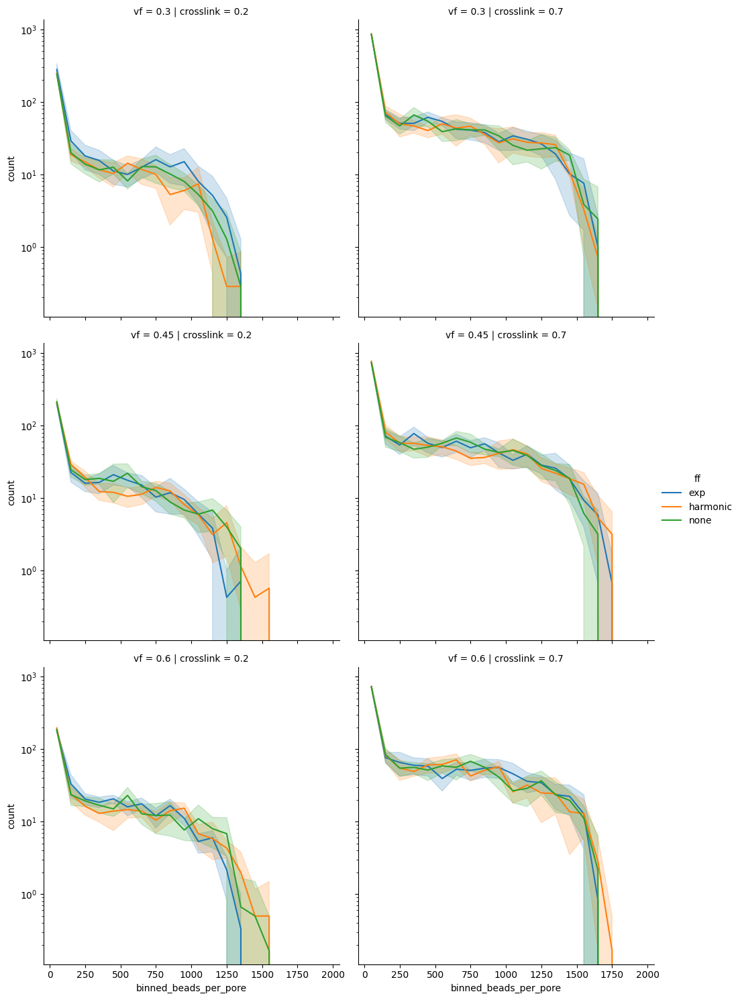

In [15]:
import seaborn as sns

df_beads_per_pore_hist = df.copy()
counts_and_bins = [np.histogram(data, bins=20, range=(0, 2000)) for data in df["beads_per_pore"]]
df_beads_per_pore_hist["count"] = [t[0] for t in counts_and_bins]
df_beads_per_pore_hist["binned_beads_per_pore"] = [(t[1][:-1] + t[1][1:]) / 2 for t in counts_and_bins]
df_beads_per_pore_hist_exploded = df_beads_per_pore_hist.explode(["count", "binned_beads_per_pore"]).reset_index(
    drop=True
)

g = sns.relplot(
    df_beads_per_pore_hist_exploded,
    kind="line",
    x="binned_beads_per_pore",
    y="count",
    row="vf",
    col="crosslink",
    hue="ff",
    # units="seed",
    # estimator=None,
)
for ax in g.axes.flat:
    ax.set_yscale("log")

- minimal differences visible for ff

## Porengrößenverteilung - VolumeFraction

In [16]:
import seaborn as sns

# no more same bins here
df_beads_per_pore_hist = df.copy()
counts_and_bins = [np.histogram(data, bins="auto") for data in df["beads_per_pore"]]
df_beads_per_pore_hist["count"] = [t[0] for t in counts_and_bins]
df_beads_per_pore_hist["binned_beads_per_pore"] = [(t[1][:-1] + t[1][1:]) / 2 for t in counts_and_bins]
df_beads_per_pore_hist_exploded = df_beads_per_pore_hist.explode(["count", "binned_beads_per_pore"]).reset_index(
    drop=True
)

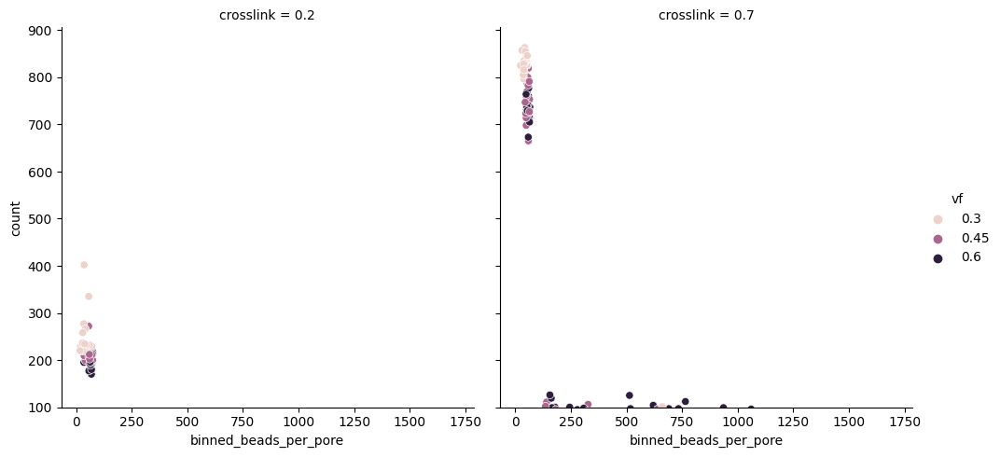

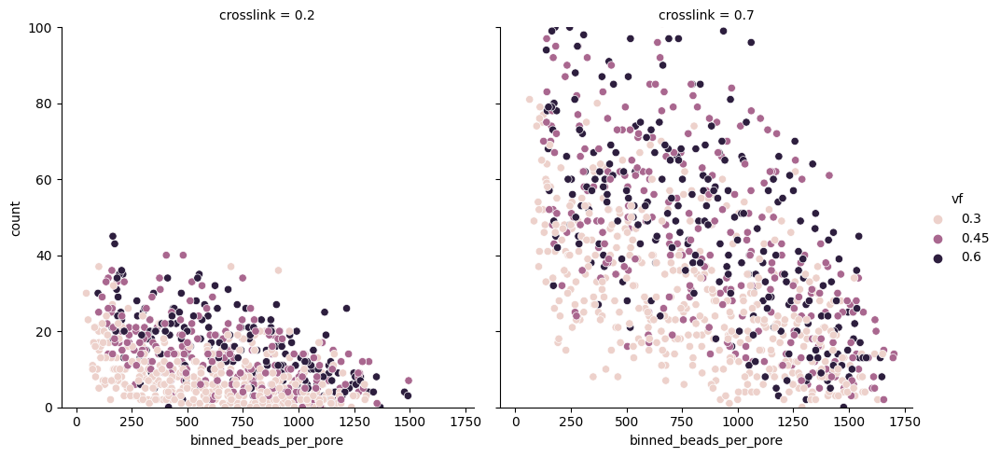

In [17]:
g1 = sns.relplot(
    df_beads_per_pore_hist_exploded,
    kind="scatter",
    x="binned_beads_per_pore",
    y="count",
    # row="vf",
    col="crosslink",
    hue="vf",
    # units="seed",
    # estimator=None,
)

g2 = sns.relplot(
    df_beads_per_pore_hist_exploded,
    kind="scatter",
    x="binned_beads_per_pore",
    y="count",
    # row="vf",
    col="crosslink",
    hue="vf",
    # units="seed",
    # estimator=None,
)

for ax in g1.axes.flat:
    ax.set_ylim(10**2, None)
    # ax.set_yscale("log")

for ax in g2.axes.flat:
    ax.set_ylim(0, 10**2)

plt.show()

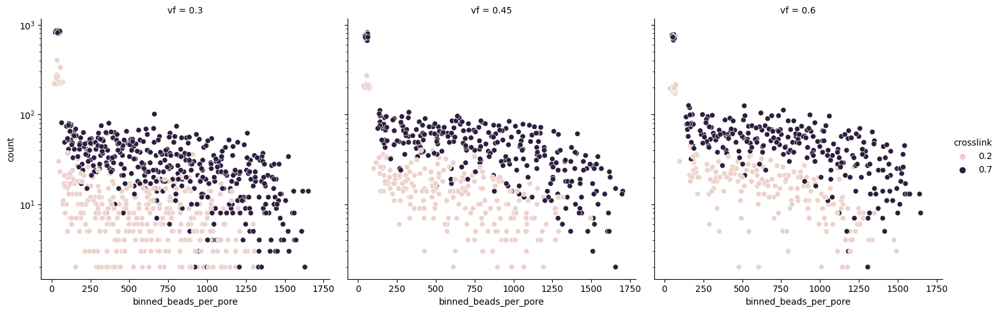

In [18]:
g = sns.relplot(
    df_beads_per_pore_hist_exploded,
    kind="scatter",
    x="binned_beads_per_pore",
    y="count",
    # row="vf",
    col="vf",
    hue="crosslink",
    # units="seed",
    # estimator=None,
)

for ax in g.axes.flat:
    # ax.set_ylim(10**2, None)
    ax.set_yscale("log")

# for ax in g2.axes.flat:
#     ax.set_ylim(0, 10**2)

plt.show()

- vf größer machen =>
    - weniger kleine Poren
    - mehr große Poren
- mehr crosslinks =>
    - mehr poren insgesamt
    - größere Poren möglich

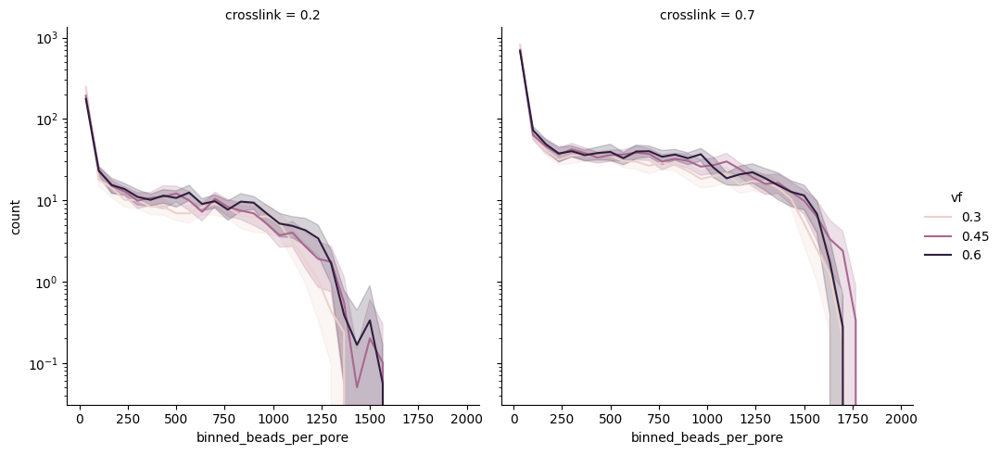

In [19]:
import seaborn as sns

df_beads_per_pore_hist = df.copy()
counts_and_bins = [np.histogram(data, bins=30, range=(0, 2000)) for data in df["beads_per_pore"]]
df_beads_per_pore_hist["count"] = [t[0] for t in counts_and_bins]
df_beads_per_pore_hist["binned_beads_per_pore"] = [(t[1][:-1] + t[1][1:]) / 2 for t in counts_and_bins]
df_beads_per_pore_hist_exploded = df_beads_per_pore_hist.explode(["count", "binned_beads_per_pore"]).reset_index(
    drop=True
)

g = sns.relplot(
    df_beads_per_pore_hist_exploded,
    kind="line",
    x="binned_beads_per_pore",
    y="count",
    col="crosslink",
    hue="vf",
    # units="seed",
    # estimator=None,
)

for ax in g.axes.flat:
    ax.set_yscale("log")
    # ax.set_ylim(0, 10**2)

plt.show()

## Porengrößenverteilung - AnzahlCrosslinks

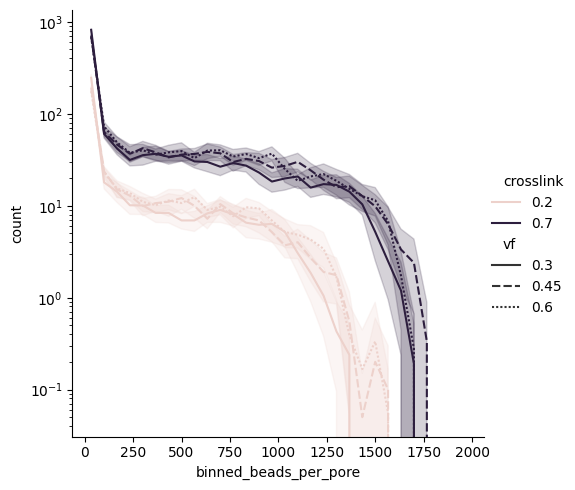

In [20]:
import seaborn as sns

df_beads_per_pore_hist = df.copy()
counts_and_bins = [np.histogram(data, bins=30, range=(0, 2000)) for data in df["beads_per_pore"]]
df_beads_per_pore_hist["count"] = [t[0] for t in counts_and_bins]
df_beads_per_pore_hist["binned_beads_per_pore"] = [(t[1][:-1] + t[1][1:]) / 2 for t in counts_and_bins]
df_beads_per_pore_hist_exploded = df_beads_per_pore_hist.explode(["count", "binned_beads_per_pore"]).reset_index(
    drop=True
)

g = sns.relplot(
    df_beads_per_pore_hist_exploded,
    kind="line",
    x="binned_beads_per_pore",
    y="count",
    # col="vf",
    hue="crosslink",
    style="vf",
    # units="seed",
    # estimator=None,
)

for ax in g.axes.flat:
    ax.set_yscale("log")
    # ax.set_ylim(0, 10**2)

plt.show()

In [21]:
df_beads_per_pore_exploded = df.explode("beads_per_pore").reset_index(drop=True)

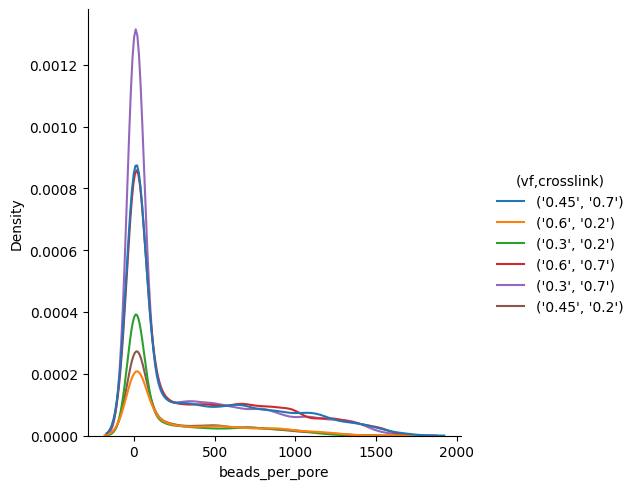

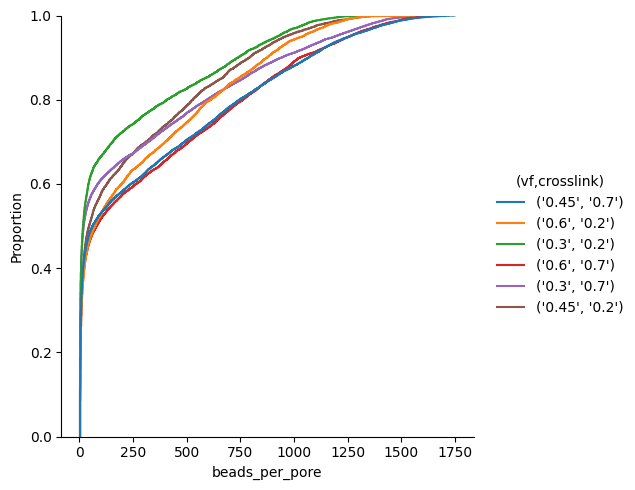

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm

df_beads_per_pore_exploded["(vf,crosslink)"] = [
    f'{(str(row["vf"]), str(row["crosslink"]))}' for _, row in df_beads_per_pore_exploded.iterrows()
]

g1 = sns.displot(
    data=df_beads_per_pore_exploded,
    kind="kde",
    x="beads_per_pore",
    hue="(vf,crosslink)",
    # col="vf",
    # row="crosslink",
    common_norm=True,
    # palette="viridis",
    # legend=False,
)
g2 = sns.displot(
    data=df_beads_per_pore_exploded,
    kind="ecdf",
    x="beads_per_pore",
    hue="(vf,crosslink)",
    # col="vf",
    # row="crosslink",
    # palette="viridis",
    # legend=False,
)

# Add the color bar
# norm = plt.Normalize(df_beads_per_pore_exploded[group_arg].min(), df_beads_per_pore_exploded[group_arg].max())
# sm = matplotlib.cm.ScalarMappable(cmap="viridis")  # , norm=norm)

# for i, ax in enumerate(reversed(g1.axes.flatten())):
#     ax.set_yscale("log")
#     # if i == 0:
#     #     plt.colorbar(sm, ax=ax)
# for i, ax in enumerate(reversed(g2.axes.flatten())):
#     ax.set_xscale("log")
#     # if i == 0:
#     #     plt.colorbar(sm, ax=ax)


plt.show()


### Summary

Auswirkungen:
- ff:
    - macht kaum Unterschied (ist gut, weil ich will hier ja nur dass die örtliche Verteilung sich unterscheidet.)

- vf erhöhen:
    - weniger Poren insgesamt (weil viele kleine verloren gehen)
    - sonst überall mehr poren

- crosslinks erhöhen:
    - von allen Porengrößen gibt es absolut mehr
    - es gibt auch noch größere Poren die es vorher nicht gab
    - proportional gibt es weniger mini-Poren
    - kleine Poren gibt es proportional gleich viele
    - 

---------------------

## Porenverteilung Örtlich

In [23]:
def pore_centers3D(gel_dir: common.GelDir, pores):
    beads = common.CheckpointDir(gel_dir.checkpoints_dir / "GelCrosslinkedDone").get_bead_points()
    return np.array([np.mean(beads[pore], axis=0) for pore in pores])


def pore_centers2D(gel_dir: common.GelDir, pores):
    beads = common.CheckpointDir(gel_dir.checkpoints_dir / "GelCrosslinkedDone").get_bead_points()
    return np.array([np.mean(beads[pore], axis=0)[:2] for pore in pores])


def pore_distances(gel_dir: common.GelDir, pores):
    com = common.CheckpointDir(gel_dir.checkpoints_dir / "GelCrosslinkedDone").get_bead_points().mean(axis=0)
    beads = pore_centers3D(gel_dir, pores)
    distances = np.linalg.norm(com - beads, axis=1)
    return distances


In [24]:
pore_centers = [pore_centers2D(row["gel_dir"], row["pores"]) for _, row in df.iterrows()]
df["pore_centers_x"] = [[center[0] for center in centers] for centers in pore_centers]
df["pore_centers_y"] = [[center[1] for center in centers] for centers in pore_centers]

df["pore_centers_x"]

0      [45.4034533061381, 45.73770667387434, 46.00323...
1      [56.505193747262446, 42.355969266344495, 42.23...
2      [46.4252899360439, 51.028709001280035, 54.5117...
3      [48.11826925025695, 43.5685511930425, 54.23714...
4      [47.640583206587394, 44.1604993862061, 44.1491...
                             ...                        
111    [41.425731065094006, 40.69485488075508, 45.121...
112    [50.92398591342602, 51.55774007841831, 50.5824...
113    [53.57025470527886, 54.6043075014303, 56.96094...
114    [41.883225739845265, 41.309419761881465, 45.82...
115    [44.86650804142988, 42.338477157209425, 41.923...
Name: pore_centers_x, Length: 116, dtype: object

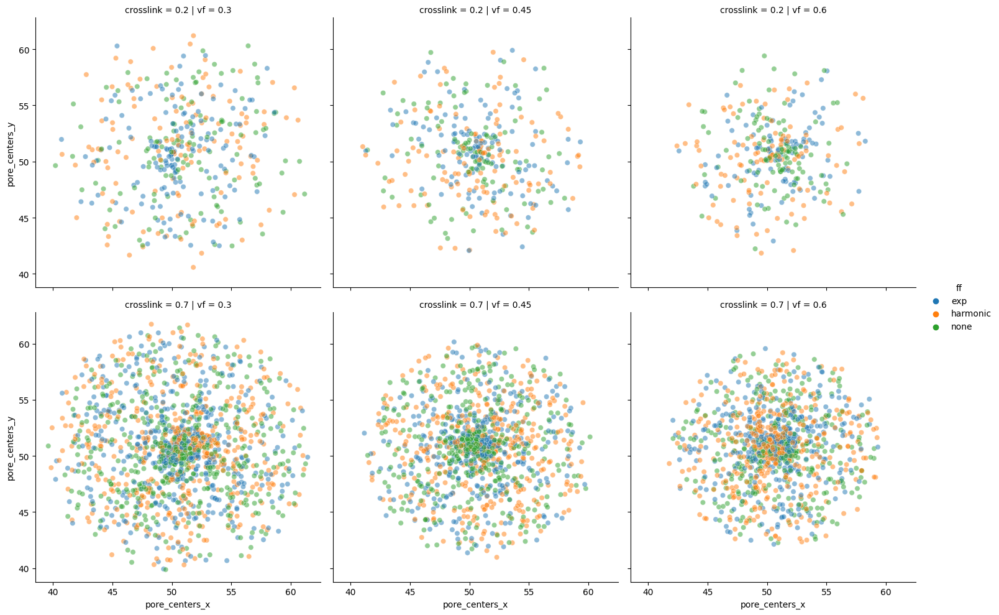

In [25]:
df_pore_centers_exploded = df.explode(["pore_centers_x", "pore_centers_y"], ignore_index=True).iloc[::20]
sns.relplot(
    df_pore_centers_exploded,
    kind="scatter",
    x="pore_centers_x",
    y="pore_centers_y",
    hue="ff",
    col="vf",
    row="crosslink",
    alpha=0.5,
)

In [26]:
df["pore_centers"] = pore_centers
df["pore_distances"] = [pore_distances(row["gel_dir"], row["pores"]) for _, row in df.iterrows()]
df["pore_distances"]

0      [9.315488375110112, 9.361698825640282, 8.65926...
1      [6.322641218539245, 9.00759860407319, 9.718537...
2      [8.51917327383669, 3.932543259987609, 6.624859...
3      [7.342571192027695, 9.60769433307019, 10.26787...
4      [6.994555621144654, 8.288518612257084, 8.42401...
                             ...                        
111    [10.029629124341387, 10.743169539319622, 10.94...
112    [7.228075325287676, 5.575111303026319, 5.81797...
113    [7.445698993753381, 6.0292138792618015, 6.6335...
114    [8.880624376319258, 9.465863561794029, 8.16281...
115    [7.182040708473634, 8.571355921208237, 9.39293...
Name: pore_distances, Length: 116, dtype: object

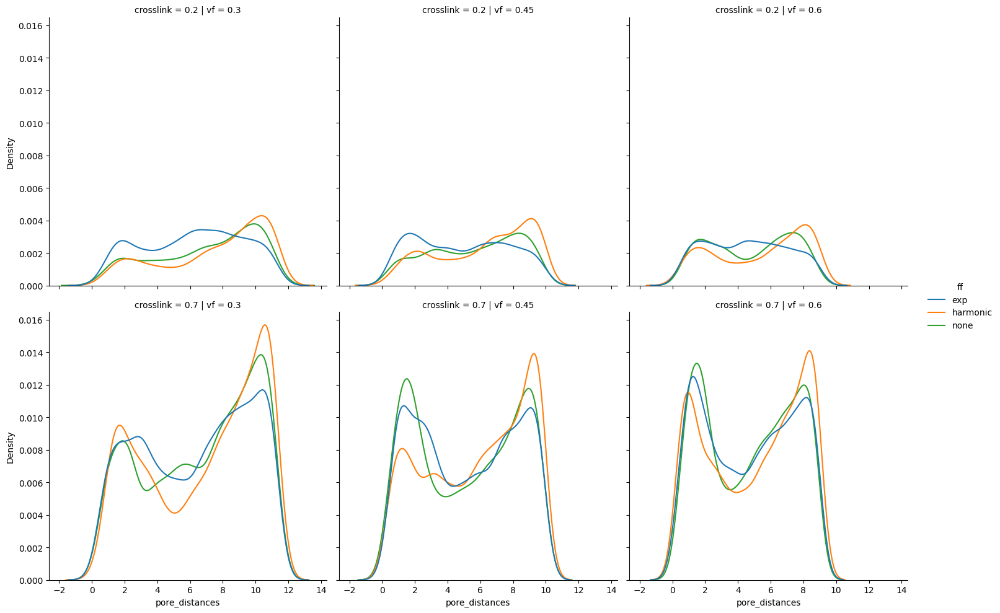

In [27]:
df_pore_distances_exploded = df.explode("pore_distances", ignore_index=True)
sns.displot(
    df_pore_distances_exploded, kind="kde", x="pore_distances", hue="ff", col="vf", row="crosslink", common_norm=True
)

## Maybe we can see a difference with the RDF method:

In [28]:
from pathlib import Path


import espressomd
import espressomd.observables

import numpy as np
import tqdm
import matplotlib.pyplot as plt

from common import CheckpointDir

if "system" not in globals() and "system" not in locals():
    system = None


def compute_crosslink_rdf(checkpoint_path: Path):
    ckpt_dir = CheckpointDir(checkpoint_path)
    bead_pos = ckpt_dir.get_bead_points()
    crosslink_ids = ckpt_dir.crosslinks_numpy()
    points = np.vstack([bead_pos[crosslink_ids[:, 0]], bead_pos[crosslink_ids[:, 1]]])

    # RDF computation
    box_l = points.max() - points.min()

    # Initialize the system and add particles
    global system
    if system is None:
        system = espressomd.System(box_l=[box_l] * 3)
    system.box_l = [box_l] * 3
    system.part.clear()
    system.part.add(pos=points)

    # RDF calculation
    # print(f"Starting RDF computation... ({len(system.part.all())} particles)")
    rdf_obs = espressomd.observables.RDF(
        # ids1=system.part.all().id, min_r=0, max_r=box_l, n_r_bins=100
        ids1=system.part.all().id,
        min_r=0,
        max_r=6.0,
        n_r_bins=80,
    )
    rs = rdf_obs.bin_centers()
    rdf = rdf_obs.calculate()

    return rs, rdf


df_rdfs = df.copy()
rs_and_rdfs = []
for g in tqdm.tqdm(df_rdfs["gel_dir"]):
    rs_and_rdfs.append(compute_crosslink_rdf(g.checkpoints_dir / "GelCrosslinkedDone"))
df_rdfs["rdf_r"] = [r for r, _ in rs_and_rdfs]
df_rdfs["rdf_dens"] = [dens for _, dens in rs_and_rdfs]

[MacBook-Pro-von-M1.local:88581] shmem: mmap: an error occurred while determining whether or not /var/folders/9k/pz7sq18n26sdjld2rt5h1dr80000gn/T//ompi.MacBook-Pro-von-M1.501/jf.0/4142923776/sm_segment.MacBook-Pro-von-M1.501.f6f00000.0 could be created.
100%|██████████| 116/116 [00:23<00:00,  4.87it/s]


In [29]:
df_rdfs_exploded = df_rdfs.explode(["rdf_r", "rdf_dens"], ignore_index=True)

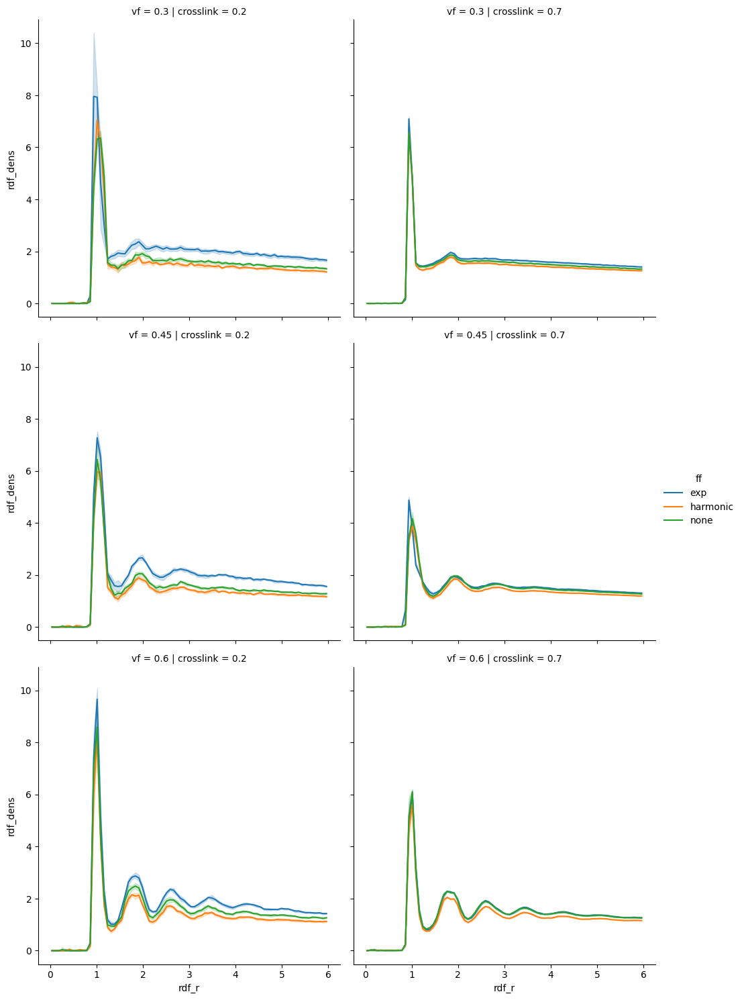

In [30]:
sns.relplot(
    df_rdfs_exploded,
    kind="line",
    x="rdf_r",
    y="rdf_dens",
    row="vf",
    col="crosslink",
    hue="ff",
)  # , legend=False)#, col="meshw", col_wrap=3, facet_kws=dict(sharey=False))

# plt.gca().set_yscale("log")
# plt.gca().set_xlim(0, 5)
plt.show()

# Bead Distribution

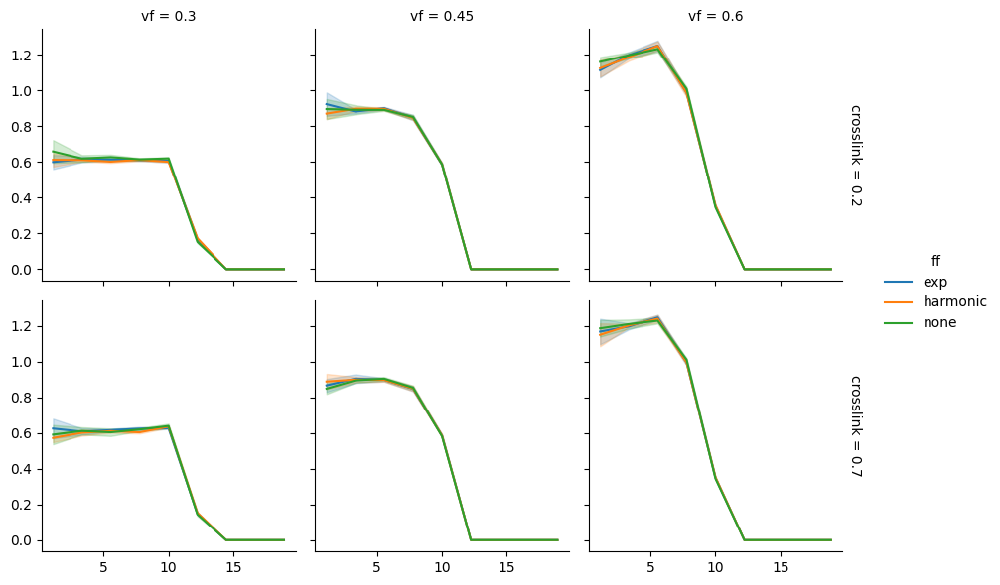

In [31]:
from analysis.distribution import compute_radial_number_density
from utils.mymath import online_mean_and_ci

max_constraint_radius = 20
max_box_size = 40


def rnd_from_file(gel_dir, *args, **kwargs):
    points = common.CheckpointDir(gel_dir.checkpoints_dir / "GelCrosslinkedDone").get_bead_points()
    result = compute_radial_number_density(points, *args, **kwargs)
    return result.r, result.number_density


def load_and_average(data, color, **kwargs):
    bin_edges = np.linspace(0, max_box_size / 2, int(max_box_size / 2) // 2)
    bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2

    mean_density, ci_low, ci_high = online_mean_and_ci(
        data_iterator=(rnd_from_file(p, bins=bin_edges)[1] for p in data["gel_dir"]), alpha=0.1
    )

    ax = plt.gca()
    ax.plot(bin_centers, mean_density, color=color, **kwargs)
    ax.fill_between(bin_centers, ci_low, ci_high, color=color, alpha=0.2)


g = sns.FacetGrid(df, row="crosslink", col="vf", hue="ff", margin_titles=True)
g.map_dataframe(load_and_average)
g.add_legend()
plt.show()

In [32]:
for gel_dir in gel_dirs:
    beads_df = gel_dir.beads_gel_eq()
    if len(beads_df) < 1:
        continue
    print(beads_df)

                                                 path  timestep
0   ../../data/raw/30112024_forcefield_eq_time_fix...      5000
1   ../../data/raw/30112024_forcefield_eq_time_fix...     10000
2   ../../data/raw/30112024_forcefield_eq_time_fix...     15000
3   ../../data/raw/30112024_forcefield_eq_time_fix...     20000
4   ../../data/raw/30112024_forcefield_eq_time_fix...     25000
5   ../../data/raw/30112024_forcefield_eq_time_fix...     30000
6   ../../data/raw/30112024_forcefield_eq_time_fix...     35000
7   ../../data/raw/30112024_forcefield_eq_time_fix...     40000
8   ../../data/raw/30112024_forcefield_eq_time_fix...     45000
9   ../../data/raw/30112024_forcefield_eq_time_fix...     50000
10  ../../data/raw/30112024_forcefield_eq_time_fix...     55000
11  ../../data/raw/30112024_forcefield_eq_time_fix...     60000
12  ../../data/raw/30112024_forcefield_eq_time_fix...     65000
13  ../../data/raw/30112024_forcefield_eq_time_fix...     70000
14  ../../data/raw/30112024_forcefield_e